### Otsu’s Image segmentation (Threshold-based segmentation)

#### Python Code implementation for Otsu’s image segmentation

It comes under threshold-based segmentation. In Otsu’s Segmentation, the input image is first processed, and then we try to obtain the histogram of the image, which will show the distribution of pixels in the image. Here we focus on peak value. The next step is to compute the threshold value and compare it with the image pixels. Set the pixel to white; if they are greater than the threshold else, set it to black.

Thus, it performs automatic thresholding. This method is not suitable for noisy images. Applications include scanning documents, recognizing patterns.

reference: https://www.analyticsvidhya.com/blog/2021/09/image-segmentation-algorithms-with-implementation-in-python/

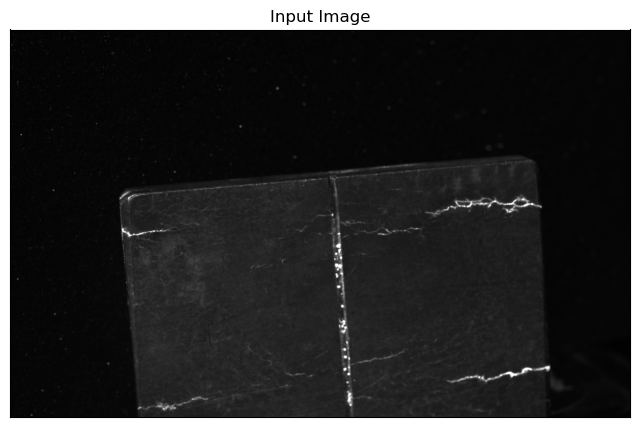

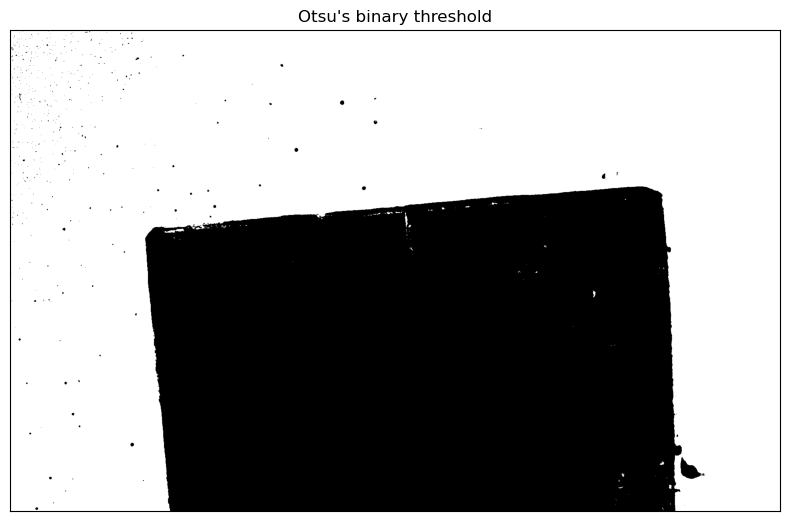

In [2]:
# SEGMENTATION
import numpy as np
import cv2
from matplotlib import pyplot as plt
img = cv2.imread(r'test_image1.bmp')
b,g,r = cv2.split(img)
rgb_img = cv2.merge([r,g,b])
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

#plt.subplot(211)
plt.subplots(figsize=(8, 8))
plt.imshow(rgb_img)
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
#plt.subplot(212),
plt.subplots(figsize=(8, 8))
plt.imshow(thresh, 'gray')
plt.imsave(r'thresh.bmp',thresh)
plt.title("Otsu's binary threshold"), plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show()

#### Edge-based image segmentation algorithms
The different types of edge detection operators are:

i. Robert operator: It highlights regions of high spatial frequency

ii. Prewitt operator: It is used for detecting vertical and horizontal edges in images

iii. Sobel operator: It is used for detecting vertical and horizontal edges in images. Similar to Prewitt.
</br>
</br>
The difference between Sobel and Prewitt Operator is that in Sobel operator the coefficients of masks are adjustable according to our requirement provided they follow all properties of derivative masks.
Both the first and second derivative masks follow these three properties:

More weight means more edge detection.
The opposite sign should be present in the mask. (+ and -)
The Sum of the mask values must be equal to zero.


### Python Code implementation for Robert operator for image segmentation:



[[0.01176471 0.01176471 0.01176471 ... 0.01568627 0.01568627 0.01568627]
 [0.01176471 0.01176471 0.01176471 ... 0.01960784 0.01568627 0.01568627]
 [0.01568627 0.01568627 0.01176471 ... 0.01568627 0.01568627 0.01568627]
 ...
 [0.03529412 0.03137255 0.02745098 ... 0.01568627 0.01568627 0.01568627]
 [0.02745098 0.02745098 0.02352941 ... 0.01568627 0.01568627 0.01568627]
 [0.02745098 0.02745098 0.02745098 ... 0.01568627 0.01568627 0.01568627]]


Text(0.5, 1.0, 'Output Image')

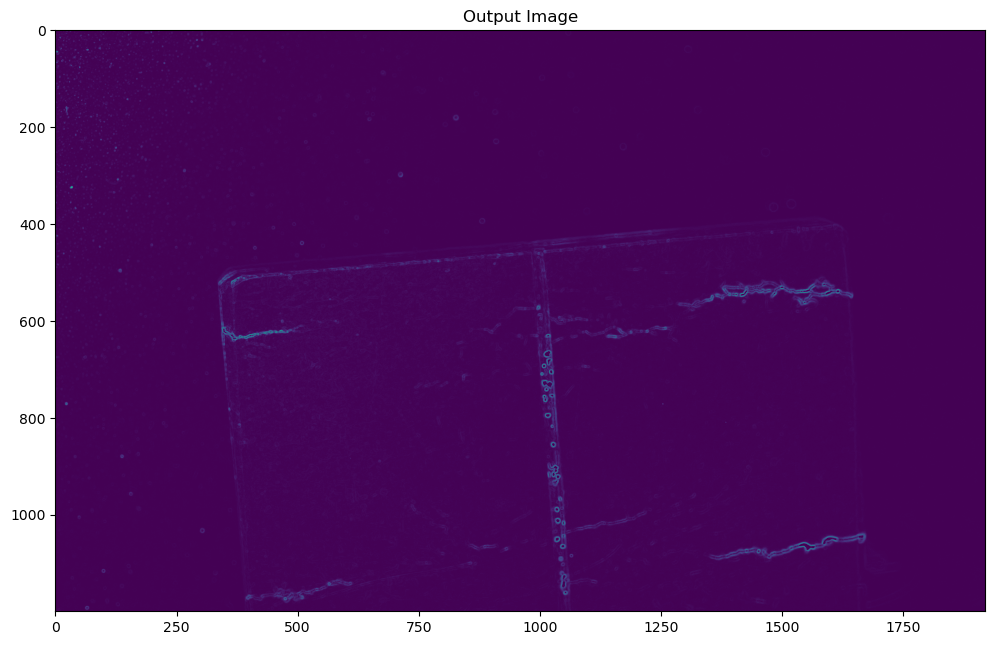

In [3]:
import cv2  
import numpy as np 
from scipy import ndimage 
  
roberts_cross_v = np.array( [[1, 0 ], 
                             [0,-1 ]] ) 
  
roberts_cross_h = np.array( [[ 0, 1 ], 
                             [ -1, 0 ]] ) 

# input_img = cv2.imread('test_image1.bmp')
# img = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
# print(img)
img = cv2.imread("test_image1.bmp",0).astype('float64') 
img/=255.0
print(img)
vertical = ndimage.convolve( img, roberts_cross_v ) 
horizontal = ndimage.convolve( img, roberts_cross_h ) 
  
edged_img = np.sqrt( np.square(horizontal) + np.square(vertical)) 
edged_img*=255
#cv2.imwrite("output.jpg",edged_img)
plt.subplots(figsize=(12, 12))
plt.imshow(edged_img)
plt.title('Output Image')


Text(0.5, 1.0, 'Output Image')

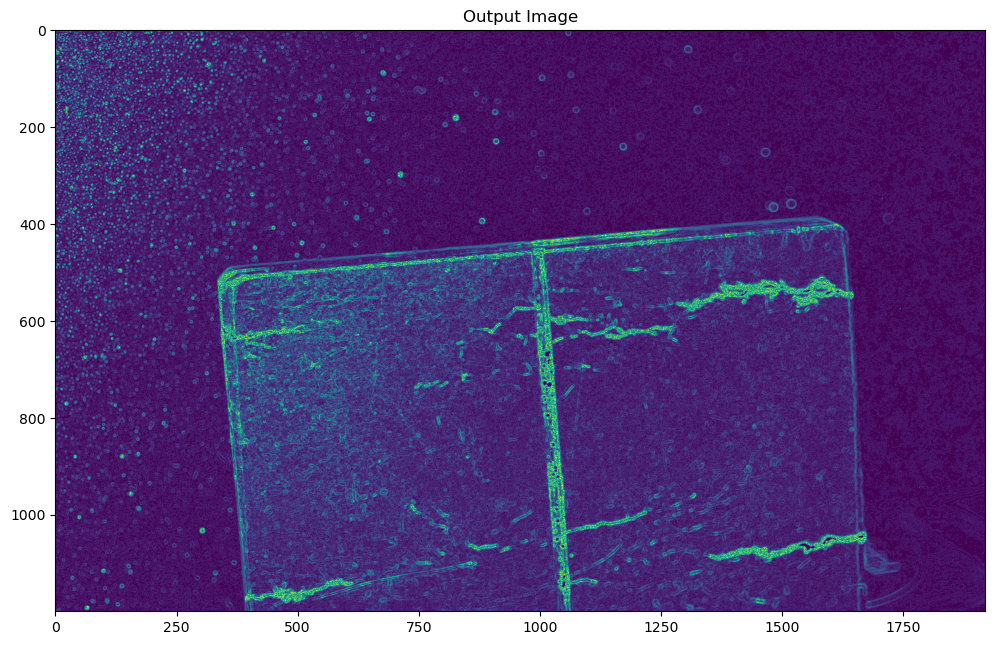

In [4]:
#same code with Gray scale image without reducing pixel division
input_img = cv2.imread('test_image1.bmp')
img = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
# print(img)
# img = cv2.imread("test_image1.bmp",0).astype('float64') 
# img/=255.0
#print(img)
roberts_cross_v = np.array( [[1, 0 ], 
                             [0,-1 ]] ) 
  
roberts_cross_h = np.array( [[ 0, 1 ], 
                             [ -1, 0 ]] ) 

vertical = ndimage.convolve( img, roberts_cross_v ) 
horizontal = ndimage.convolve( img, roberts_cross_h ) 
  
edged_img = np.sqrt( np.square(horizontal) + np.square(vertical)) 
#edged_img*=255
#cv2.imwrite("output.jpg",edged_img)
plt.subplots(figsize=(12, 12))
plt.imshow(edged_img)
plt.title('Output Image')

### Python Code implementation for Prewitt operator:

Text(0.5, 1.0, 'Prewitt')

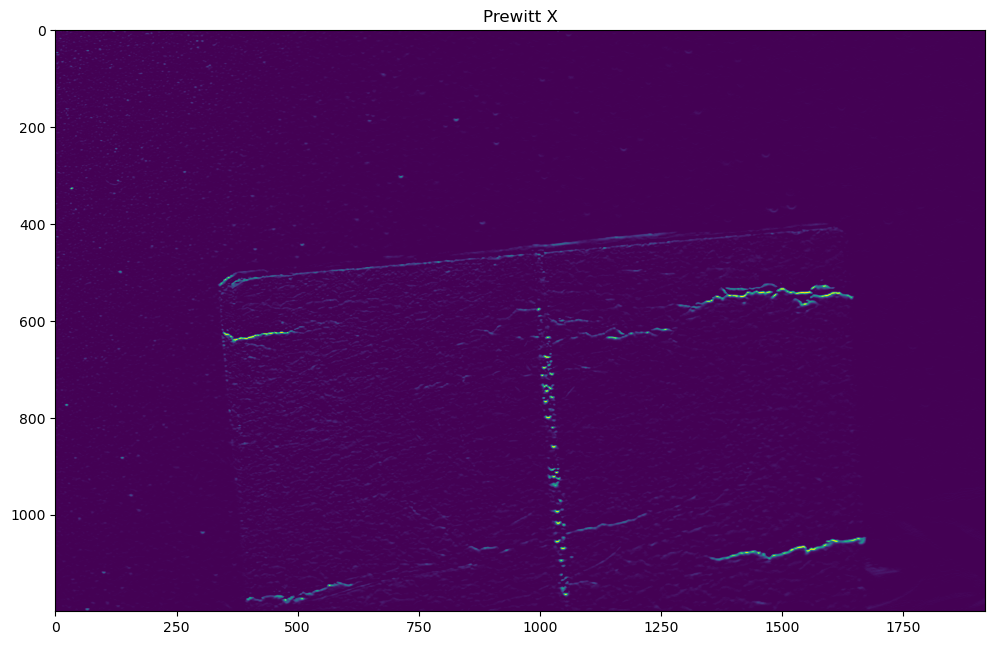

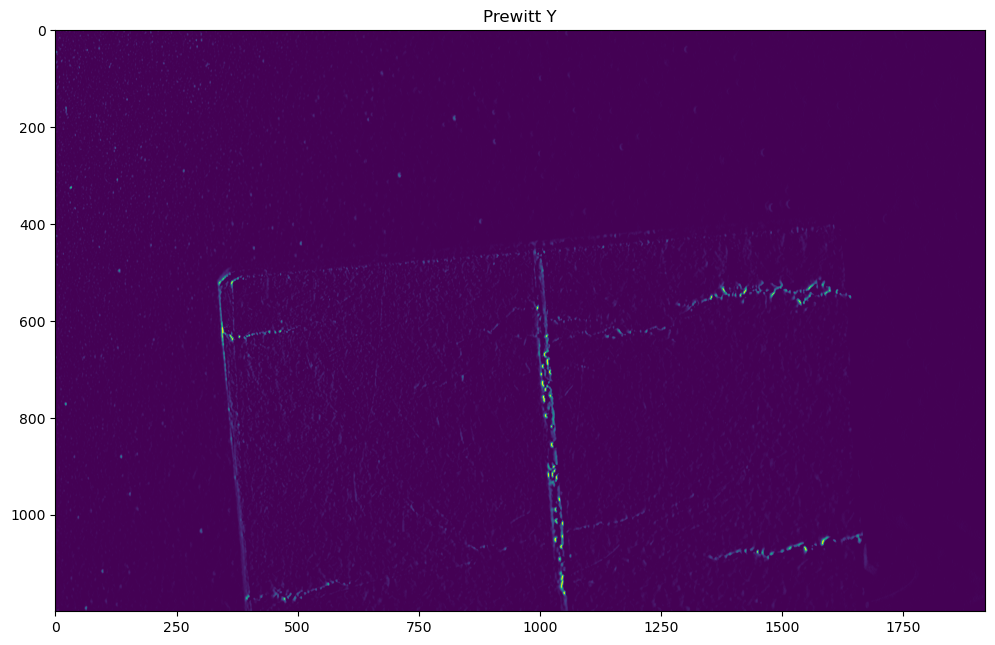

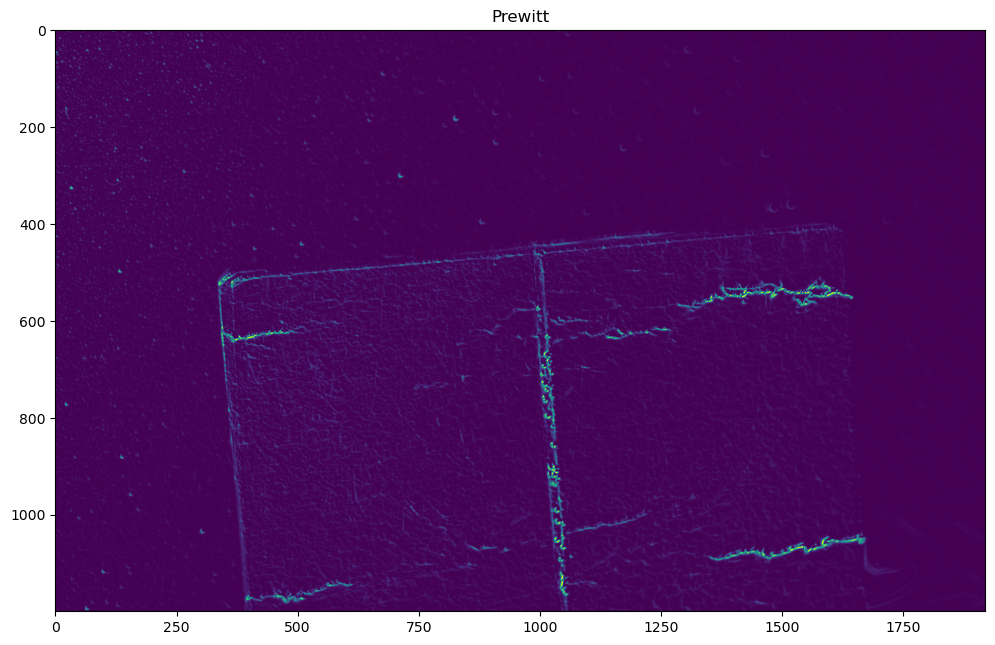

In [5]:
img = cv2.imread('test_image1.bmp')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_gaussian = cv2.GaussianBlur(gray,(3,3),0)

#prewitt
kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

img_prewittx = cv2.filter2D(img_gaussian, -1, kernelx)
img_prewitty = cv2.filter2D(img_gaussian, -1, kernely)

# cv2.imshow("Prewitt X", img_prewittx)
# cv2.imshow("Prewitt Y", img_prewitty)
# cv2.imshow("Prewitt", img_prewittx + img_prewitty)

plt.subplots(figsize=(12, 12))
plt.imshow(img_prewittx)
plt.title('Prewitt X')

plt.subplots(figsize=(12, 12))
plt.imshow(img_prewitty)
plt.title('Prewitt Y')

plt.subplots(figsize=(12, 12))
plt.imshow(img_prewittx + img_prewitty)
plt.title('Prewitt')




#### Python Code implementation for Sobel operator:

Text(0.5, 1.0, 'Sobel')

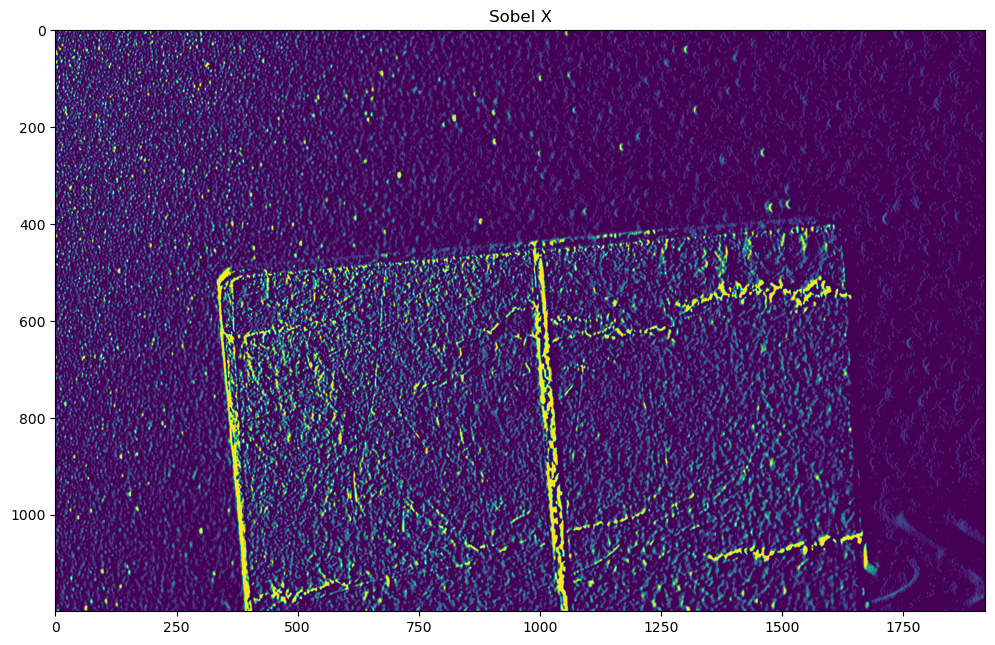

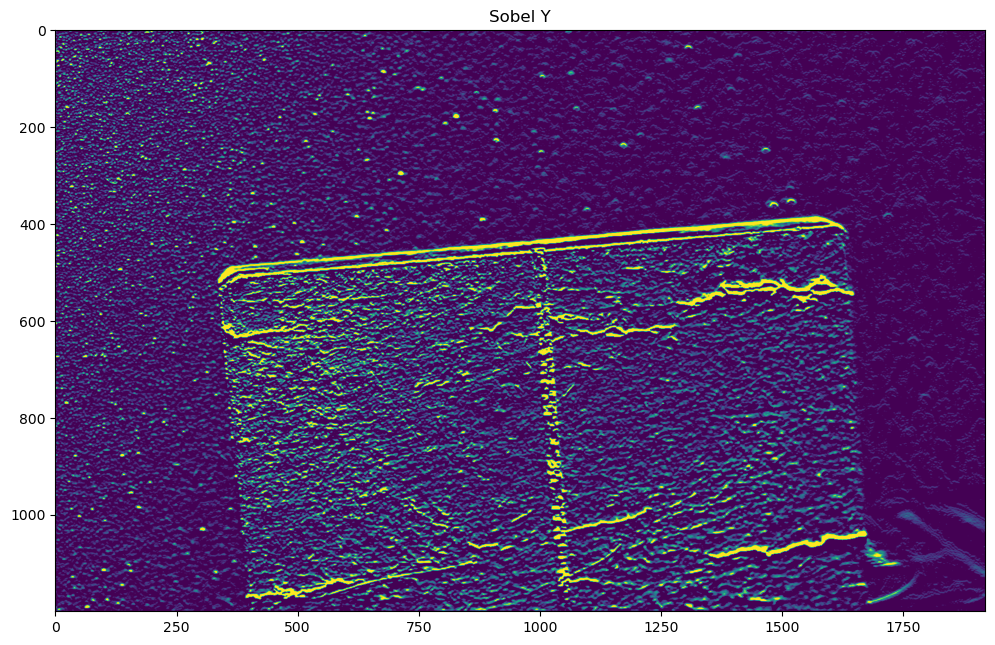

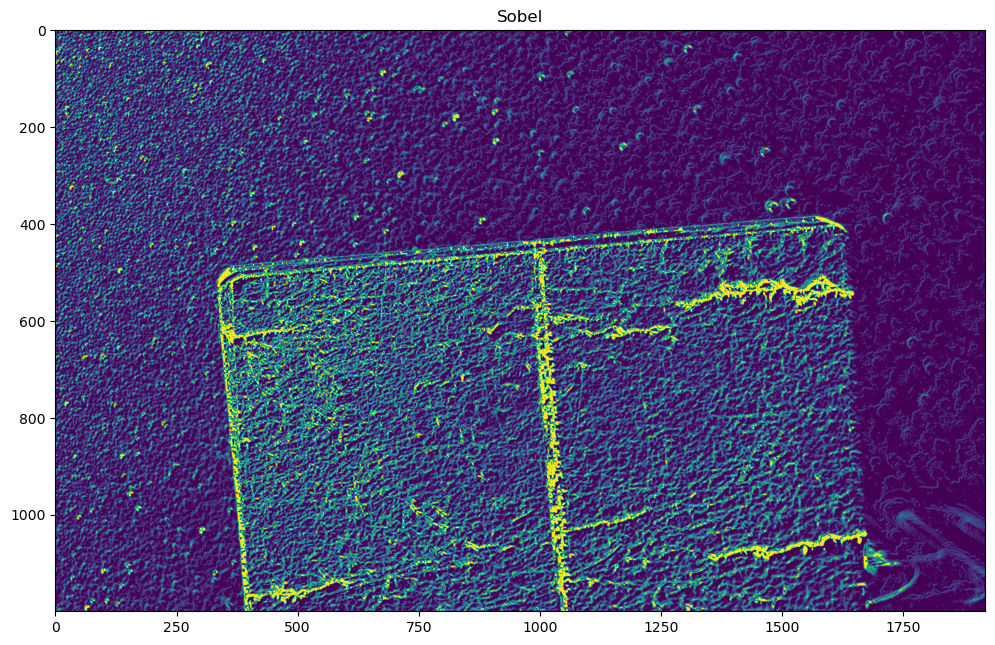

In [15]:
img = cv2.imread('test_image1.bmp')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img_gaussian = cv2.GaussianBlur(gray,(3,3),0)

#sobel
img_sobelx = cv2.Sobel(img_gaussian,cv2.CV_8U,1,0,ksize=5)
img_sobely = cv2.Sobel(img_gaussian,cv2.CV_8U,0,1,ksize=5)
img_sobel = img_sobelx + img_sobely

plt.subplots(figsize=(12, 12))
plt.imshow(img_sobelx)
plt.title('Sobel X')

plt.subplots(figsize=(12, 12))
plt.imshow(img_sobely)
plt.title('Sobel Y')

plt.subplots(figsize=(12, 12))
plt.imshow(img_sobel)
plt.title('Sobel')



Text(0.5, 1.0, 'Sobel after median filter')

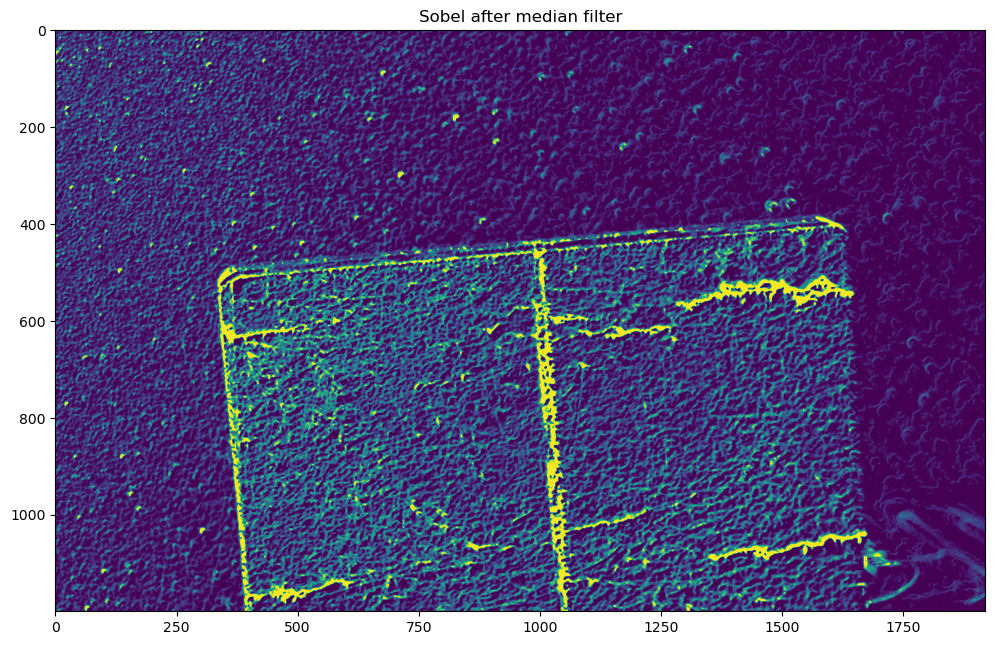

In [16]:
median = cv2.medianBlur(img_sobel, 5) # app
plt.subplots(figsize=(12, 12))
plt.imshow(median)
plt.title('Sobel after median filter')

#### Python code with Canny operator

Text(0.5, 1.0, 'Removing small objects')

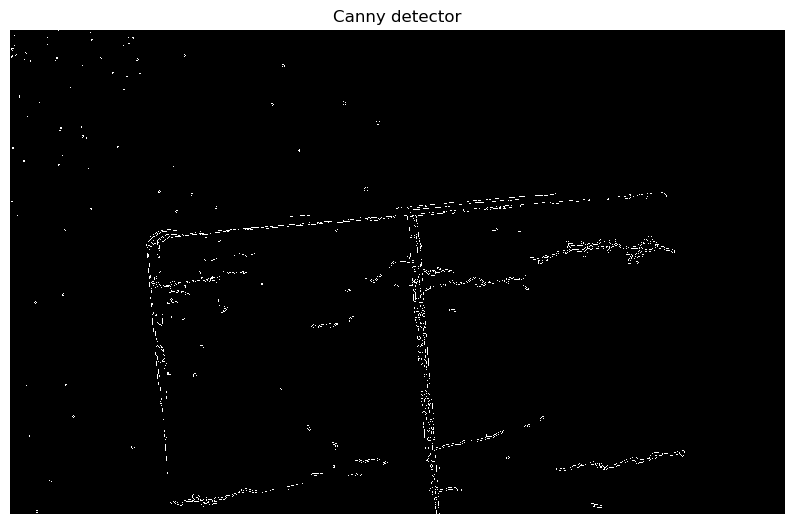

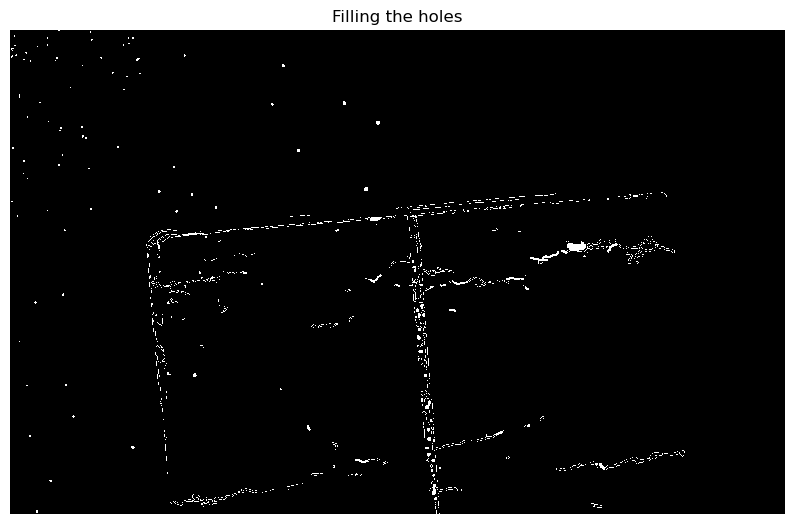

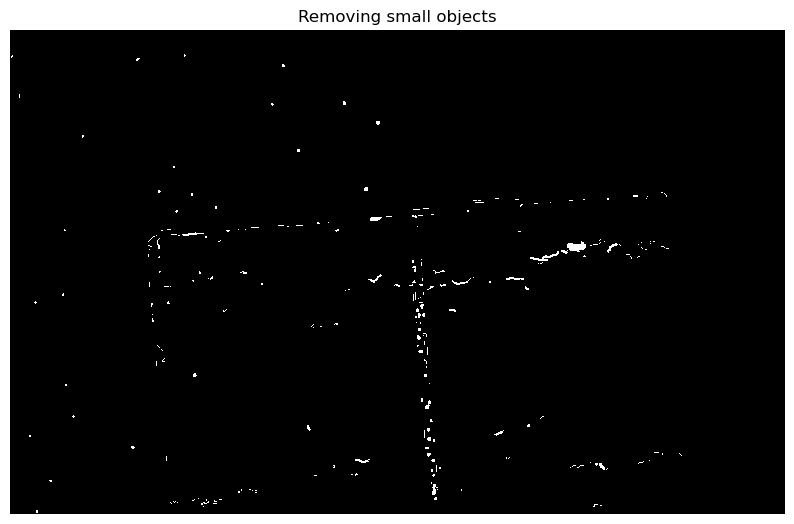

In [6]:
from skimage.feature import canny
img = cv2.imread('test_image1.bmp')

grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

edges = canny(grey)

fig, ax = plt.subplots(figsize=(10, 10))

ax.imshow(edges, cmap=plt.cm.gray, interpolation='nearest')

ax.axis('off')

ax.set_title('Canny detector')

from scipy import ndimage as ndi

fill_coins = ndi.binary_fill_holes(edges)

fig, ax = plt.subplots(figsize=(10, 10))

ax.imshow(fill_coins, cmap=plt.cm.gray, interpolation='nearest')

ax.axis('off')

ax.set_title('Filling the holes')

from skimage import morphology

coins_cleaned = morphology.remove_small_objects(fill_coins, 21)

fig, ax = plt.subplots(figsize=(10, 10))

ax.imshow(coins_cleaned, cmap=plt.cm.gray, interpolation='nearest')

ax.axis('off')

ax.set_title('Removing small objects')

### Region-based image segmentation algorithm

#### Python Code implementation for Region based segmentation:

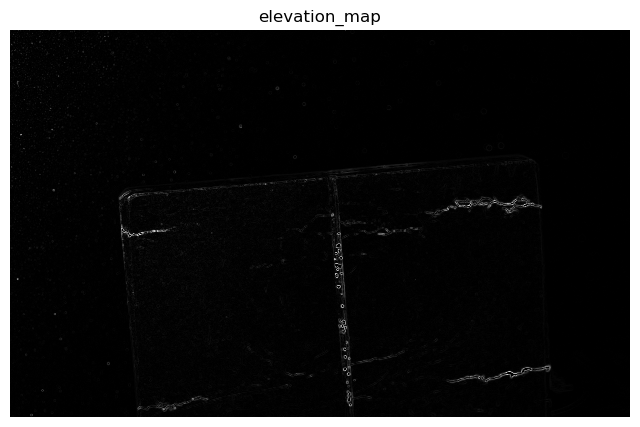

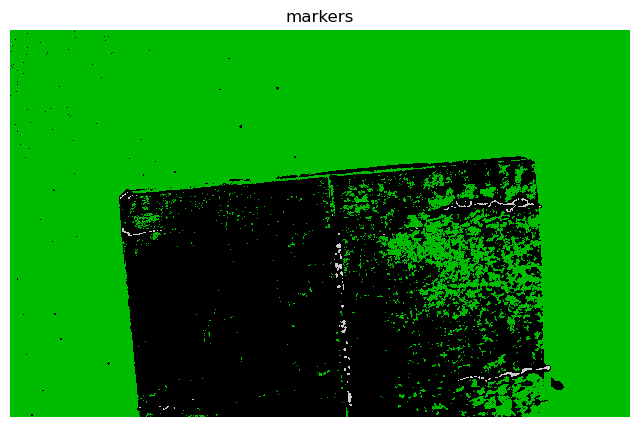

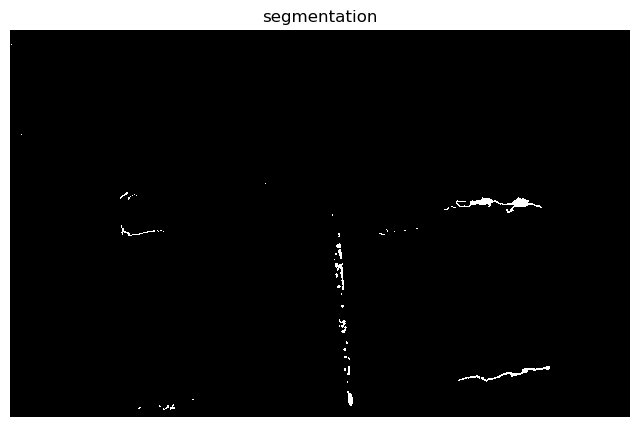

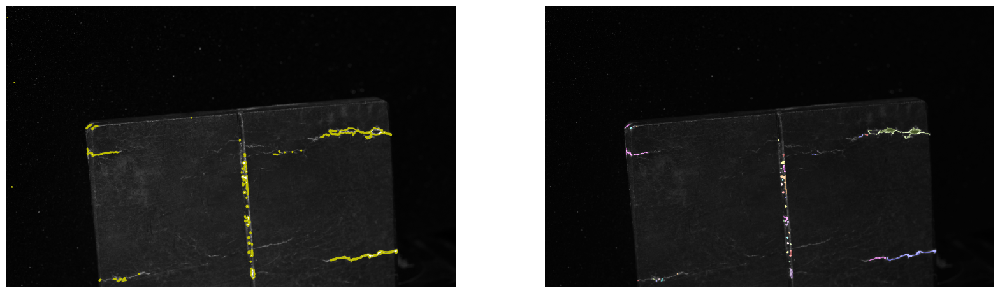

In [7]:
from skimage.filters import sobel
from skimage.segmentation import watershed

elevation_map = sobel(grey)

fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(elevation_map, cmap=plt.cm.gray, interpolation='nearest')

ax.axis('off')

ax.set_title('elevation_map')

markers = np.zeros_like(grey)

markers[grey < 30] = 1

markers[grey > 150] = 2

fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(markers, cmap=plt.cm.nipy_spectral, interpolation='nearest')

ax.axis('off')

ax.set_title('markers')

segmentation = watershed(elevation_map, markers)

fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(segmentation, cmap=plt.cm.gray, interpolation='nearest')

ax.axis('off')

ax.set_title('segmentation')

from skimage.color import label2rgb

segmentation = ndi.binary_fill_holes(segmentation - 1)

labeled_coins, _ = ndi.label(segmentation)

image_label_overlay = label2rgb(labeled_coins, image=grey)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20), sharex=True, sharey=True)

ax1.imshow(grey, cmap=plt.cm.gray, interpolation='nearest')

ax1.contour(segmentation, [0.5], linewidths=1.2, colors='y')

ax1.axis('off')

#ax1.set_adjustable('box-forced')

ax2.imshow(image_label_overlay, interpolation='nearest')

ax2.axis('off')

#ax2.set_adjustable('box-forced')

fig.subplots_adjust(bottom=0.1, top=0.9)
#fig.subplots_adjust(**margin)

### Neural networks for image segmentation using python

In [8]:
# import tensorflow as tf
# from tensorflow import keras
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
# from tensorflow.keras.layers import Conv2D, MaxPooling2D
# model = Sequential()
# model.add(Conv2D(filters=16,kernel_size=3,padding="same",activation="relu",input_shape=(50,50,1)))
# model.add(MaxPooling2D(pool_size=2))
# model.add(Conv2D(filters=32,kernel_size=3,padding="same",activation="relu"))
# model.add(MaxPooling2D(pool_size=2))
# model.add(Conv2D(filters=64,kernel_size=3,padding="same",activation="relu"))
# model.add(MaxPooling2D(pool_size=2))
# model.add(Dropout(0.2))
# model.add(Flatten())
# model.add(Dense(200,activation='relu'))
# model.add(Dropout(0.5))
# model.add(Dense(2,activation='softmax'))
# model.summary()
# model.compile(loss="categorical_crossentropy",optimizer='adam',metrics=['accuracy'])
# model.fit(X_train,y_train,batch_size=50,epochs=20,verbose=1)

### Python Code implementation for Watershed segmentation:

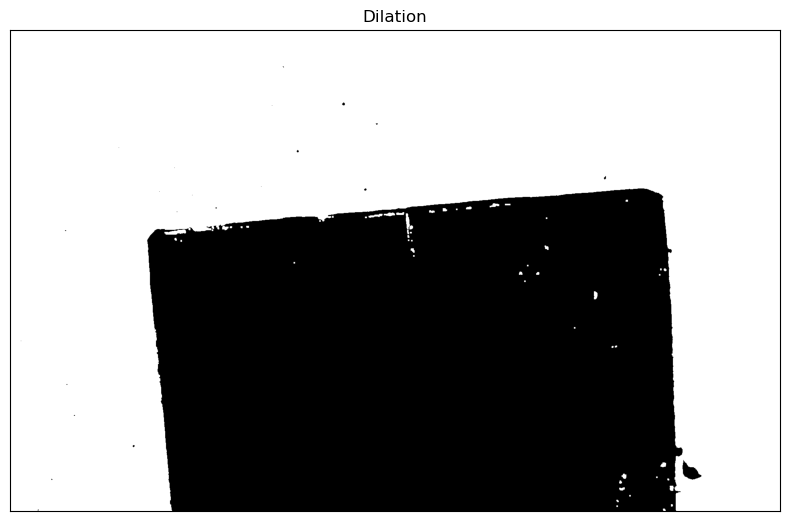

In [34]:
# SEGMENTATION
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('test_image1.bmp')

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# b,g,r = cv2.split(img)
# rgb_img = cv2.merge([r,g,b])

#ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

# noise removal
kernel = np.ones((2,2),np.uint8)
opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 2)
closing = cv2.morphologyEx(thresh,cv2.MORPH_CLOSE,kernel, iterations = 2)
# sure background area
sure_bg = cv2.dilate(closing,kernel,iterations=3)
# Finding sure foreground area
dist_transform = cv2.distanceTransform(sure_bg,cv2.DIST_L2,3)
# Threshold
ret, sure_fg = cv2.threshold(dist_transform,0.01*dist_transform.max(),255,0)
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# Now, mark the region of unknown with zero
markers[unknown==255] = 0
markers = cv2.watershed(img,markers)
img[markers == -1] = [255,0,0]

# plt.subplots(figsize=(8, 8))
# plt.imshow(closing, 'gray')
# plt.title("morphologyEx:Closing:2x2"), plt.xticks([]), plt.yticks([])
plt.subplots(figsize=(8, 8))
plt.imshow(sure_bg, 'gray')
#plt.imsave(r'dilation.png',sure_bg)
plt.title("Dilation"), plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show()


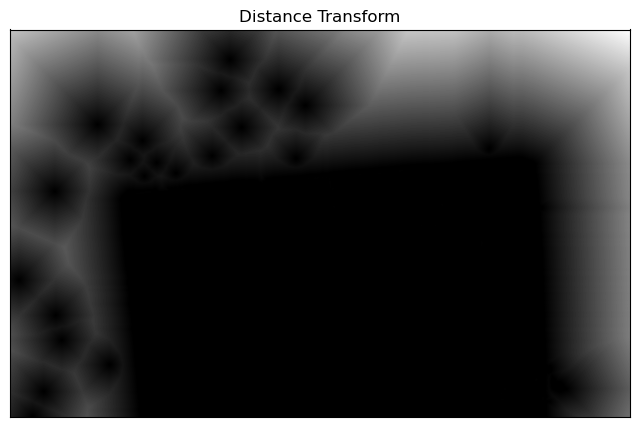

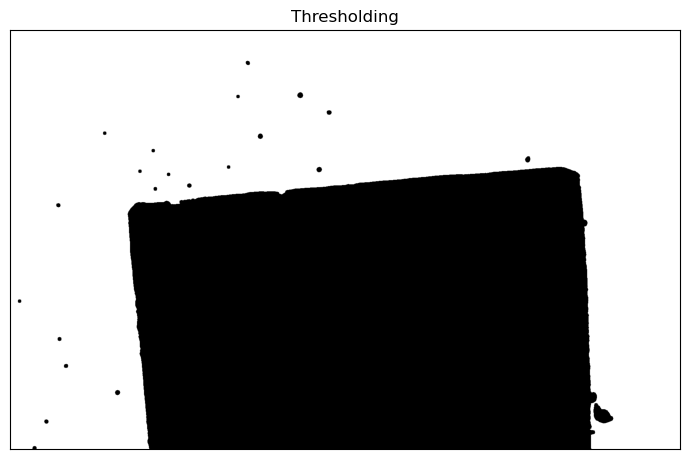

In [35]:
plt.subplots(figsize=(8, 8))
plt.imshow(dist_transform, 'gray')
plt.title("Distance Transform"), plt.xticks([]), plt.yticks([])
plt.subplots(figsize=(7, 7)),plt.imshow(sure_fg, 'gray')
plt.title("Thresholding"), plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show()

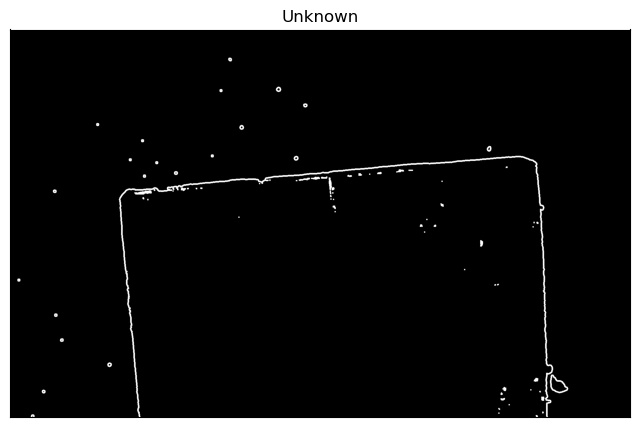

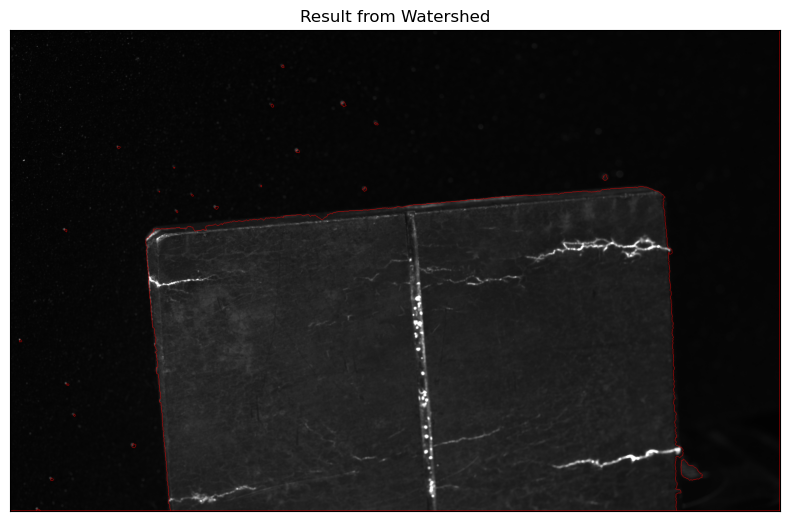

In [37]:
plt.subplots(figsize=(8, 8))
plt.imshow(unknown, 'gray')
plt.title("Unknown"), plt.xticks([]), plt.yticks([])
plt.subplots(figsize=(8, 8))
plt.imshow(img, 'gray')
plt.imsave(r'watershed.png',img)
plt.title("Result from Watershed"), plt.xticks([]), plt.yticks([])
plt.tight_layout()
plt.show()